The input data consists of hyperspectral bands over a single landscape in Indiana, US, (Indian Pines data set) with 145×145 pixels. For each pixel, the data set contains 220 spectral reflectance bands which represent different portions of the electromagnetic spectrum in the wavelength range 0.4–2.5 10^(-6) meters

In [ ]:
import numpy as np

In [ ]:
arr=np.array([1,2,3,4,5,6,7])
arr

array([1, 2, 3, 4, 5, 6, 7])

In [ ]:
arr.shape

(7,)

In [ ]:
import matplotlib.pyplot as plt

import numpy as np
import seaborn as sns

import plotly.graph_objects as go
import plotly.express as px

from scipy.io import loadmat

import pandas as pd

from sklearn.preprocessing import minmax_scale
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score,precision_score,recall_score,
                             confusion_matrix, classification_report)

import tensorflow as tf

from tqdm import tqdm
from numpy.random import seed
from time import time

seed(11)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from scipy.io import loadmat

# Load the MATLAB file
mat_data = loadmat('/content/drive/MyDrive/Pavia University dataset/PaviaU.mat')

# Print the variable names in the MATLAB file
print(mat_data.keys())

dict_keys(['__header__', '__version__', '__globals__', 'paviaU'])


In [ ]:
from scipy.io import loadmat

# Load the MATLAB file
mat_data = loadmat('/content/drive/MyDrive/Pavia University dataset/PaviaU_gt.mat')

# Print the variable names in the MATLAB file
print(mat_data.keys())

dict_keys(['__header__', '__version__', '__globals__', 'paviaU_gt'])


## Load Data

In [ ]:
data = loadmat('/content/drive/MyDrive/Pavia University dataset/PaviaU.mat')['paviaU']

gt = loadmat('/content/drive/MyDrive/Pavia University dataset/PaviaU_gt.mat')['paviaU_gt']

print(f'Data Shape: {data.shape[:-1]}\nNumber of Bands: {data.shape[-1]}')
# print(f'Data Shape2: {data.shape[1]}\nNumber of Bands: {data.shape[-1]}')
print(f'gt Shape: {gt.shape[:-1]}\nNumber of Bands: {gt.shape[-1]}')

Data Shape: (610, 340)
Number of Bands: 103
gt Shape: (610,)
Number of Bands: 340


In [ ]:
df = pd.DataFrame(data.reshape(data.shape[0]*data.shape[1],-1))#Calculates Total number of elements int the orignal data , often used to flatten or reshape a multi-dimensional array into a one-dimensional array.
#-1 in the reshape function is a placeholder that indicates that the number of columns should be automatically determined based on the total number of elements calculated in the previous step.
df.shape

(207400, 103)

In [ ]:
df.columns = ['band' + str(i) for i in range(1, df.shape[-1] + 1)]
df['class'] = gt.ravel() #to convert 2d array to 1d array

In [ ]:
df.head()#values displayed are the spectral values corresponding to the bands

,band1,band2,band3,band4,band5,band6,band7,band8,band9,band10,...,band95,band96,band97,band98,band99,band100,band101,band102,band103,class
0,647,499,464,371,291,319,365,322,296,305,...,3416,3335,3256,3226,3205,3210,3221,3238,3250,0
1,604,546,527,455,378,377,336,314,324,329,...,2583,2538,2509,2511,2501,2468,2442,2464,2528,0
2,621,746,556,360,285,300,274,276,332,319,...,2288,2242,2193,2202,2225,2266,2308,2345,2361,0
3,637,592,482,556,508,284,178,198,193,224,...,2675,2609,2541,2551,2571,2569,2573,2620,2644,0
4,625,560,480,360,377,341,264,208,231,266,...,2392,2344,2289,2328,2415,2424,2386,2431,2456,0


## Data Visualization

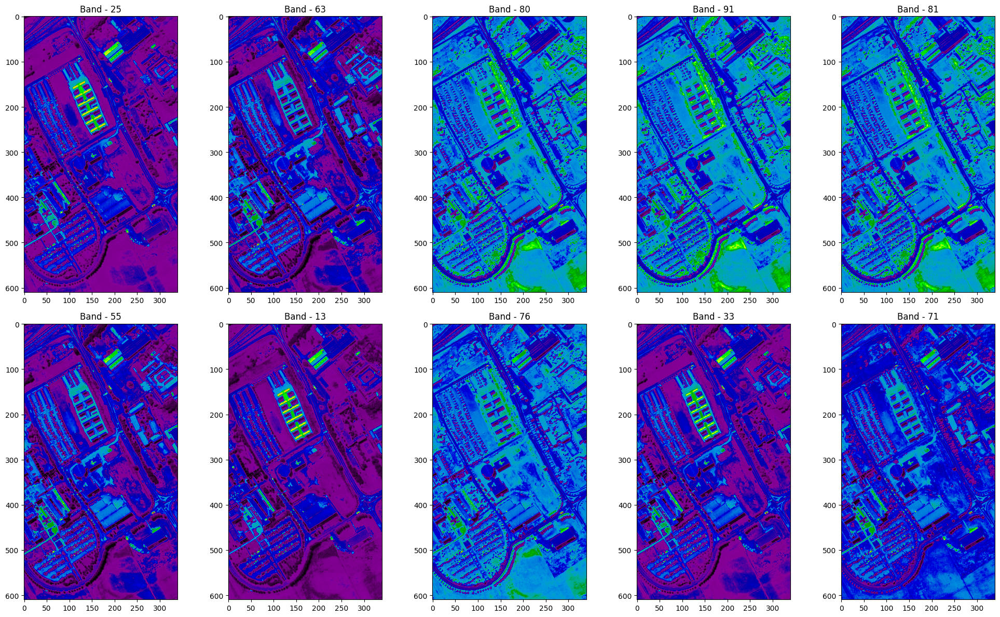

In [ ]:
fig = plt.figure(figsize = (20, 12))

ax = fig.subplots(2, 5)

for i in range(2):
  for j in range(5):
    c = np.random.randint(103)
    ax[i][j].imshow(data[:, :, c], cmap='nipy_spectral')
    ax[i][j].axis('on')
    ax[i][j].title.set_text(f"Band - {c}")
    c+=1

plt.tight_layout()# Call tight_layout to adjust the spacing between subplots
plt.show()

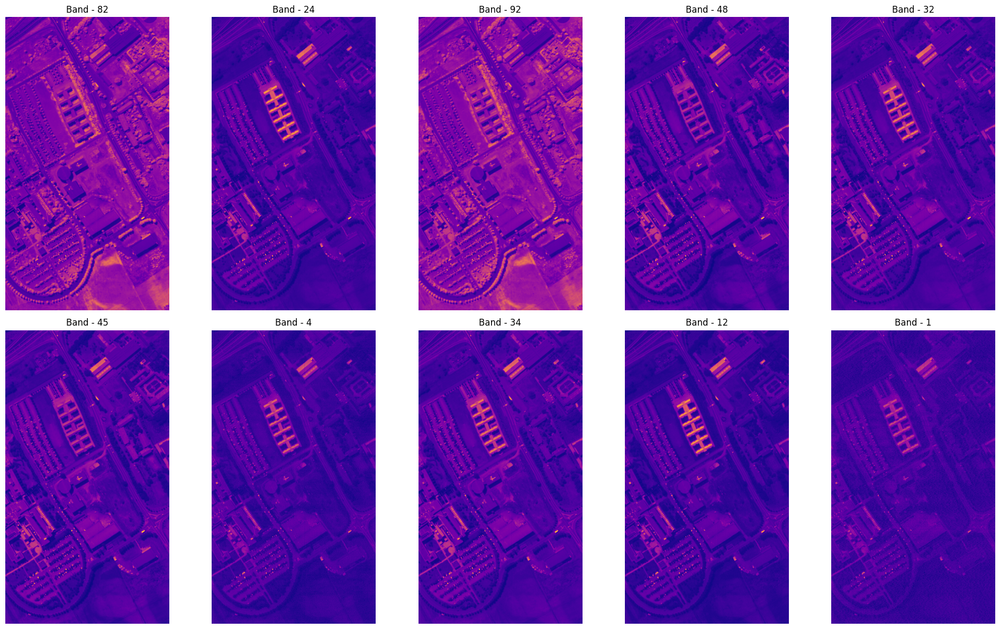

In [ ]:
fig = plt.figure(figsize = (20, 12))

ax = fig.subplots(2, 5)

for i in range(2):
  for j in range(5):
    c = np.random.randint(103)
    ax[i][j].imshow(data[:, :, c], cmap='plasma')
    ax[i][j].axis('off')
    ax[i][j].title.set_text(f"Band - {c}")
    c+=1

plt.tight_layout()
plt.show()


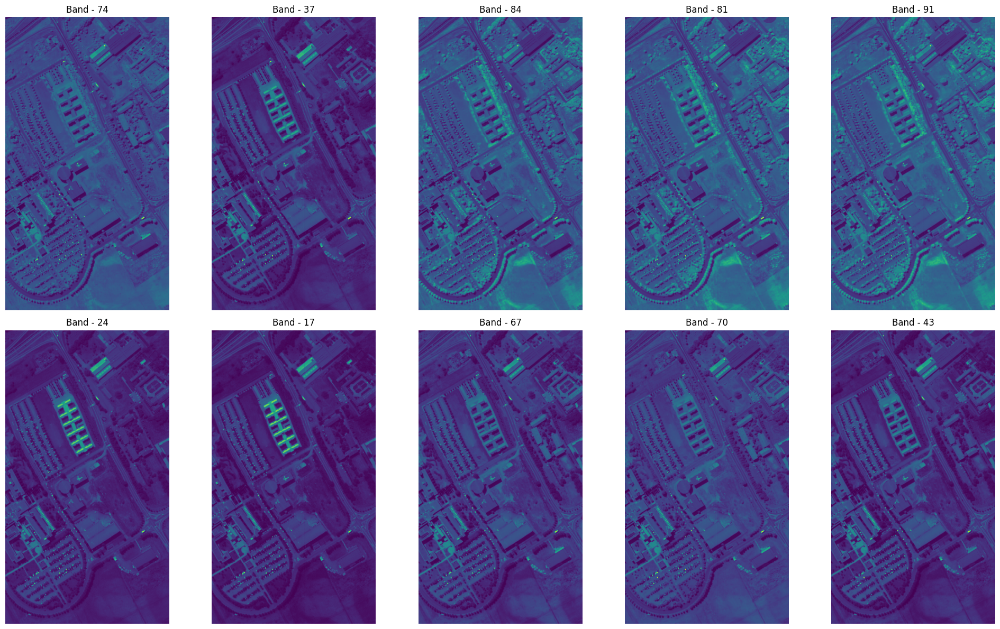

In [ ]:
fig = plt.figure(figsize = (20, 12))

ax = fig.subplots(2, 5)

for i in range(2):
  for j in range(5):
    c = np.random.randint(103)
    ax[i][j].imshow(data[:, :, c], cmap='viridis')
    ax[i][j].axis('off')
    ax[i][j].title.set_text(f"Band - {c}")
    c+=1

plt.tight_layout()
plt.show()


## RGB Composite Image

In [ ]:
!pip install earthpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 65.3 MB/s eta 0:00:00


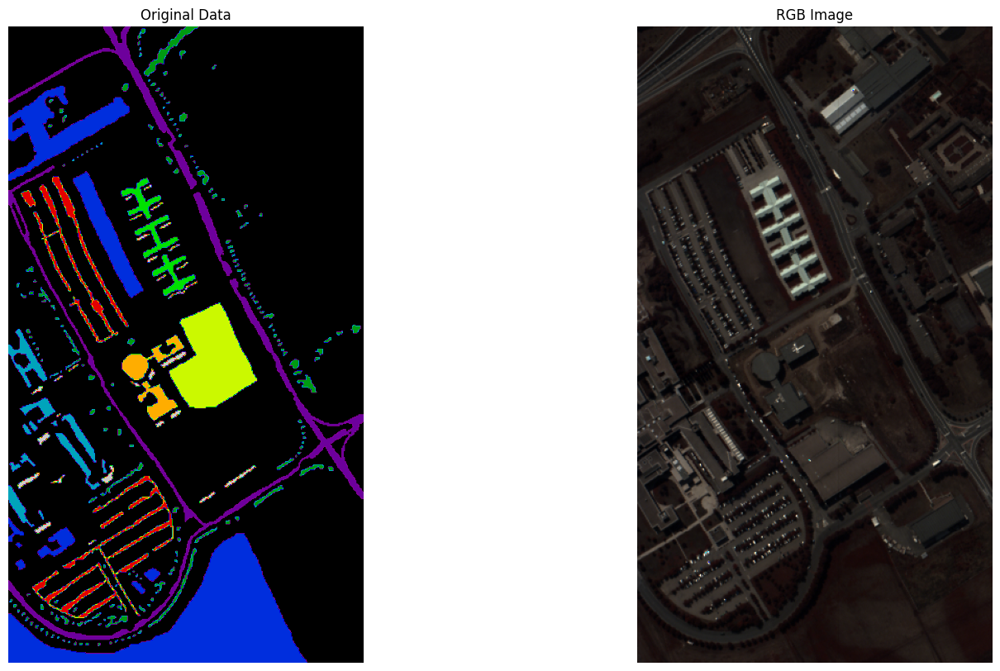

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import earthpy.plot as ep  # Assuming you are using earthpy for ep.plot_rgb

def plot_data(data):
    fig, axes = plt.subplots(1, 2, figsize=(18, 10))

    # Plot the first image using plot_data
    axes[0].imshow(gt, cmap='nipy_spectral')
    axes[0].set_title('Original Data')
    axes[0].axis('off')


    # Plot the second image using ep.plot_rgb
    mdata = np.moveaxis(data, -1, 0)
    ep.plot_rgb(mdata, (29, 19, 9), ax=axes[1], figsize=(15, 15))
    axes[1].set_title('RGB Image')
    axes[1].axis('off')

    plt.show()

# Assuming gt and data are defined somewhere before this function call
plot_data(data)

## Scaling Data

In [ ]:
from keras.utils import to_categorical

In [ ]:
t_df = df[df['class']!=0]#as 0 represents land cover that is not associated with any class
ind = ['band'+str(i) for i in range(1, t_df.shape[-1])]
ind

['band1',
 'band2',
 'band3',
 'band4',
 'band5',
 'band6',
 'band7',
 'band8',
 'band9',
 'band10',
 'band11',
 'band12',
 'band13',
 'band14',
 'band15',
 'band16',
 'band17',
 'band18',
 'band19',
 'band20',
 'band21',
 'band22',
 'band23',
 'band24',
 'band25',
 'band26',
 'band27',
 'band28',
 'band29',
 'band30',
 'band31',
 'band32',
 'band33',
 'band34',
 'band35',
 'band36',
 'band37',
 'band38',
 'band39',
 'band40',
 'band41',
 'band42',
 'band43',
 'band44',
 'band45',
 'band46',
 'band47',
 'band48',
 'band49',
 'band50',
 'band51',
 'band52',
 'band53',
 'band54',
 'band55',
 'band56',
 'band57',
 'band58',
 'band59',
 'band60',
 'band61',
 'band62',
 'band63',
 'band64',
 'band65',
 'band66',
 'band67',
 'band68',
 'band69',
 'band70',
 'band71',
 'band72',
 'band73',
 'band74',
 'band75',
 'band76',
 'band77',
 'band78',
 'band79',
 'band80',
 'band81',
 'band82',
 'band83',
 'band84',
 'band85',
 'band86',
 'band87',
 'band88',
 'band89',
 'band90',
 'band91',
 'band92

Each row in your representation likely corresponds to a pixel in an image, and each column corresponds to a specific spectral band.

In your example, you have 10,249 rows, which could mean that you have information for 10,249 pixels, and each pixel has spectral information from 200 bands.

In [ ]:
X = t_df.loc[:, ind]
X

,band1,band2,band3,band4,band5,band6,band7,band8,band9,band10,...,band94,band95,band96,band97,band98,band99,band100,band101,band102,band103
91,1447,1113,973,1053,1180,1263,1285,1320,1283,1295,...,1793,1788,1749,1696,1708,1714,1698,1660,1643,1610
92,1203,1304,1402,1525,1586,1560,1461,1430,1434,1453,...,1123,1103,1096,1113,1164,1167,1109,1075,1126,1182
93,1579,1498,1299,1208,1251,1282,1291,1257,1221,1183,...,1127,1116,1100,1116,1122,1138,1146,1137,1145,1161
94,562,850,1020,1075,1008,914,992,998,929,930,...,2139,2122,2112,2144,2142,2109,2135,2139,2130,2122
95,1188,1174,1189,1383,1451,1433,1452,1486,1518,1520,...,1747,1749,1728,1683,1651,1620,1582,1556,1574,1620
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207341,911,1038,1026,879,798,889,904,784,839,921,...,2636,2632,2640,2651,2644,2629,2632,2629,2635,2634
207342,962,764,802,862,894,951,934,883,858,799,...,2708,2705,2712,2722,2688,2644,2628,2629,2627,2681
207343,758,439,489,694,812,789,733,753,822,862,...,2752,2799,2818,2828,2800,2737,2753,2751,2734,2720
207344,1000,741,802,887,946,958,870,835,872,852,...,2965,2988,3006,3008,2929,2844,2836,2870,2895,2899


In [ ]:

y = to_categorical(t_df.loc[:, 'class'])

X_scaled = minmax_scale(X, axis = 0);#rescaling the range of features to scale the range in [0, 1] or [−1, 1].

X_scaled.shape, y.shape

((42776, 103), (42776, 10))

## Split Data

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y,
                                                    stratify=y,#stratify=y argument ensures that the class distribution in y is preserved when splitting X and y into training and testing sets
                                                    test_size=0.20)
print(f"X_train: {X_train.shape}\ny_train: {y_train.shape}\nX_test: {X_test.shape}\ny_test: {y_test.shape}")

X_train: (34220, 103)
y_train: (34220, 10)
X_test: (8556, 103)
y_test: (8556, 10)


## Build CNN

In [ ]:
ip_shape = X_train[1].shape

n_outputs = y_train.shape[1]

X_train[1].ravel().shape

(103,)

In [ ]:
X_train.shape[0]

34220

In [ ]:
X_train = X_train.reshape(-1, X_train.shape[0], 1)
X_test = X_test.reshape(-1, X_test.shape[0], 1)
X_train.shape

(34220, 103, 1)

In [ ]:
from keras.models import Sequential


In [ ]:
!pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 2.4 MB/s eta 0:00:00


In [ ]:
from keras.layers import Conv1D
from keras.layers import MaxPooling1D
from keras.layers import Dropout
from keras.layers import Flatten
from keras.layers import Dense
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.callbacks import TensorBoard
from kerastuner.tuners import RandomSearch
seed_value = 42
tf.random.set_seed(seed_value)

<ipython-input-29-8d208741b8ee>:9: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import RandomSearch


In [ ]:
def build_model(hp):
    model = Sequential(name='Indian_pinesCNN')

    # First set of layers with tunable hyperparameters
    model.add(Conv1D(
        filters=hp.Int('conv_1_filter', min_value=32, max_value=128, step=16),
        kernel_size=hp.Choice('conv_1_kernel', values=[3, 5]),
        activation='relu',
        input_shape=(ip_shape[0], 1),
        name='Layer1'
    ))

    model.add(Conv1D(
        filters=hp.Int('conv_2_filter', min_value=32, max_value=64, step=16),
        kernel_size=hp.Choice('conv_2_kernel', values=[3, 5]),
        activation='relu',
        name='Layer2'
    ))

    # Adding hyperparameters to each layer
    model.add(Conv1D(
        filters=hp.Int('conv_3_filter', min_value=32, max_value=128, step=16),
        kernel_size=hp.Choice('conv_3_kernel', values=[3, 5]),
        activation='relu',
        name='Layer3'
    ))

    model.add(MaxPooling1D(
        pool_size=hp.Choice('maxpool_1_size', values=[2, 3]),
        name='MaxPooling_Layer1'
    ))

    model.add(Dropout(
        hp.Float('dropout_1', min_value=0.1, max_value=0.5, step=0.1),
        name='Dropout1'
    ))

    # Additional convolutional layers
    for i in range(4, 7):
        model.add(Conv1D(
            filters=hp.Int(f'conv_{i}_filter', min_value=32, max_value=64, step=16),
            kernel_size=hp.Choice(f'conv_{i}_kernel', values=[3, 5]),
            activation='relu',
            name=f'Layer{i}'
        ))

    model.add(MaxPooling1D(
        pool_size=hp.Choice('maxpool_2_size', values=[2, 3]),
        name='MaxPooling_Layer2'
    ))

    model.add(Dropout(
        hp.Float('dropout_2', min_value=0.1, max_value=0.5, step=0.1),
        name='Dropout2'
    ))

    model.add(Flatten(name='Flatten'))

    # Dense layer with tunable units
    model.add(Dense(
        hp.Int('dense_units', min_value=10, max_value=100, step=10),
        activation='relu',
        name='DenseLayer'
    ))

    # Output layer
    model.add(Dense(
        n_outputs,
        activation='softmax',
        name='OutputLayer'
    ))

    # Compile the model
    model.compile(
        optimizer=hp.Choice('optimizer', values=['adam', 'rmsprop']),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=10,  # Adjust the number of trials
    executions_per_trial=2,  # Execute each model configuration multiple times
    directory='output',
    project_name='Indian_pinesCNN_tuning'
)

In [ ]:
tuner.search(X_train, y_train,
             epochs=3,
             validation_split=0.1)

Trial 10 Complete [00h 01m 09s]
val_accuracy: 0.8192577362060547

Best val_accuracy So Far: 0.8614844977855682
Total elapsed time: 00h 09m 08s


In [ ]:
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

In [ ]:
model = build_model(best_hps)
model.summary()

Model: "Indian_pinesCNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Layer1 (Conv1D)             (None, 99, 48)            288       
                                                                 
 Layer2 (Conv1D)             (None, 95, 32)            7712      
                                                                 
 Layer3 (Conv1D)             (None, 91, 64)            10304     
                                                                 
 MaxPooling_Layer1 (MaxPool  (None, 30, 64)            0         
 ing1D)                                                          
                                                                 
 Dropout1 (Dropout)          (None, 30, 64)            0         
                                                                 
 Layer4 (Conv1D)             (None, 26, 64)            20544     
                                                   

In [ ]:
history = model.fit(X_train, y_train,
                    epochs=90,
                    validation_split=0.1)

Epoch 1/90
963/963 [==============================] - 10s 9ms/step - loss: 0.7394 - accuracy: 0.7128 - val_loss: 0.6092 - val_accuracy: 0.7726
Epoch 2/90
963/963 [==============================] - 6s 6ms/step - loss: 0.5165 - accuracy: 0.7858 - val_loss: 0.4532 - val_accuracy: 0.8054
Epoch 3/90
963/963 [==============================] - 7s 8ms/step - loss: 0.4549 - accuracy: 0.8131 - val_loss: 0.4506 - val_accuracy: 0.8261
Epoch 4/90
963/963 [==============================] - 7s 7ms/step - loss: 0.4228 - accuracy: 0.8276 - val_loss: 0.3612 - val_accuracy: 0.8583
Epoch 5/90
963/963 [==============================] - 7s 7ms/step - loss: 0.3952 - accuracy: 0.8412 - val_loss: 0.3579 - val_accuracy: 0.8551
Epoch 6/90
963/963 [==============================] - 7s 8ms/step - loss: 0.3772 - accuracy: 0.8490 - val_loss: 0.3179 - val_accuracy: 0.8749
Epoch 7/90
963/963 [==============================] - 6s 6ms/step - loss: 0.3506 - accuracy: 0.8592 - val_loss: 0.3116 - val_accuracy: 0.8746
Epoch

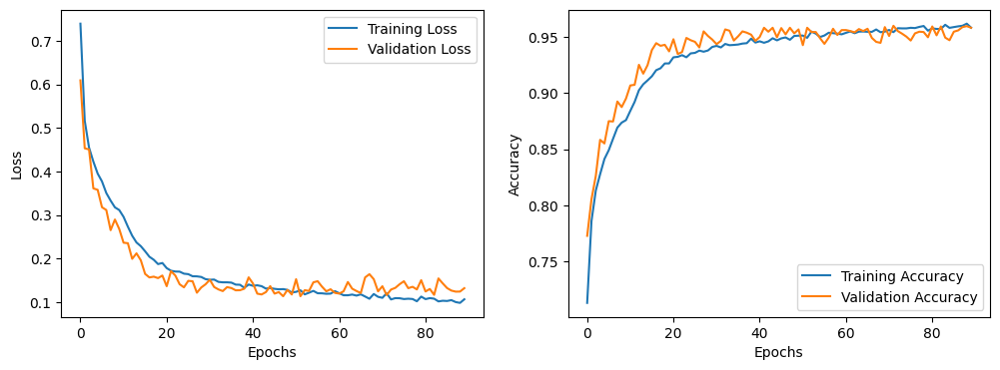

In [ ]:
import matplotlib.pyplot as plt

# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.show()


In [ ]:
accuracy_l=[]
precision_l=[]
recall_l=[]

In [ ]:
print(history.history['accuracy'])

[0.7128384709358215, 0.7858302593231201, 0.8130722641944885, 0.8275862336158752, 0.8411909937858582, 0.8489837050437927, 0.8592116236686707, 0.8691798448562622, 0.8736281394958496, 0.875868558883667, 0.8841158747673035, 0.892103374004364, 0.9025261402130127, 0.9078186750411987, 0.9112929701805115, 0.9149619936943054, 0.9203844666481018, 0.9221053123474121, 0.9263913035392761, 0.9264237880706787, 0.9318786859512329, 0.9323008060455322, 0.933794379234314, 0.9319111704826355, 0.9353854060173035, 0.9358400106430054, 0.9378530979156494, 0.93687903881073, 0.9379504919052124, 0.9411325454711914, 0.942074179649353, 0.9406779408454895, 0.9437950253486633, 0.9426586031913757, 0.9429183602333069, 0.943275511264801, 0.9441197514533997, 0.9444769024848938, 0.9485031366348267, 0.9450289011001587, 0.9461328387260437, 0.9448340535163879, 0.9460679292678833, 0.9488602876663208, 0.9469770789146423, 0.9487628936767578, 0.9496071338653564, 0.9474965929985046, 0.95093834400177, 0.9511656761169434, 0.951263

In [ ]:
print("Evaluate on test data")
results = model.evaluate(X_test, y_test, batch_size=128)
print("test loss, test acc:", results)

Evaluate on test data
67/67 [==============================] - 1s 5ms/step - loss: 0.1593 - accuracy: 0.9486
test loss, test acc: [0.15932023525238037, 0.9485741257667542]


In [ ]:
print("Generate predictions for 3 samples")
predictions = model.predict(X_test[:17])
print("predictions shape:", predictions.shape)

Generate predictions for 3 samples
1/1 [==============================] - 0s 257ms/step
predictions shape: (17, 10)


In [ ]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)


X_train shape: (34220, 103, 1)
y_train shape: (34220, 10)
X_test shape: (8556, 103, 1)
y_test shape: (8556, 10)


In [ ]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_curve, roc_auc_score, auc

In [ ]:
from sklearn.metrics import precision_score, recall_score

# Assuming y_test is in one-hot encoded format
predictions = model.predict(X_test)
y_1d1 = np.argmax(predictions, axis=1)

# If y_test is in one-hot encoded format, convert it to class indices
y_true_classes = np.argmax(y_test, axis=1)

# Calculate precision and recall
precision = precision_score(y_true_classes, y_1d1, average='weighted')
recall = recall_score(y_true_classes, y_1d1, average='weighted')

print("Precision:", precision)
print("Recall:", recall)


268/268 [==============================] - 1s 4ms/step
Precision: 0.9489790644282688
Recall: 0.9485741000467508


SVM PART

In [ ]:
t_df = df[df['class']!=0]#as 0 represents land cover that is not associated with any class
ind = ['band'+str(i) for i in range(1, t_df.shape[-1])]
ind

['band1',
 'band2',
 'band3',
 'band4',
 'band5',
 'band6',
 'band7',
 'band8',
 'band9',
 'band10',
 'band11',
 'band12',
 'band13',
 'band14',
 'band15',
 'band16',
 'band17',
 'band18',
 'band19',
 'band20',
 'band21',
 'band22',
 'band23',
 'band24',
 'band25',
 'band26',
 'band27',
 'band28',
 'band29',
 'band30',
 'band31',
 'band32',
 'band33',
 'band34',
 'band35',
 'band36',
 'band37',
 'band38',
 'band39',
 'band40',
 'band41',
 'band42',
 'band43',
 'band44',
 'band45',
 'band46',
 'band47',
 'band48',
 'band49',
 'band50',
 'band51',
 'band52',
 'band53',
 'band54',
 'band55',
 'band56',
 'band57',
 'band58',
 'band59',
 'band60',
 'band61',
 'band62',
 'band63',
 'band64',
 'band65',
 'band66',
 'band67',
 'band68',
 'band69',
 'band70',
 'band71',
 'band72',
 'band73',
 'band74',
 'band75',
 'band76',
 'band77',
 'band78',
 'band79',
 'band80',
 'band81',
 'band82',
 'band83',
 'band84',
 'band85',
 'band86',
 'band87',
 'band88',
 'band89',
 'band90',
 'band91',
 'band92

In [ ]:
X = t_df.loc[:, ind]
X

,band1,band2,band3,band4,band5,band6,band7,band8,band9,band10,...,band94,band95,band96,band97,band98,band99,band100,band101,band102,band103
91,1447,1113,973,1053,1180,1263,1285,1320,1283,1295,...,1793,1788,1749,1696,1708,1714,1698,1660,1643,1610
92,1203,1304,1402,1525,1586,1560,1461,1430,1434,1453,...,1123,1103,1096,1113,1164,1167,1109,1075,1126,1182
93,1579,1498,1299,1208,1251,1282,1291,1257,1221,1183,...,1127,1116,1100,1116,1122,1138,1146,1137,1145,1161
94,562,850,1020,1075,1008,914,992,998,929,930,...,2139,2122,2112,2144,2142,2109,2135,2139,2130,2122
95,1188,1174,1189,1383,1451,1433,1452,1486,1518,1520,...,1747,1749,1728,1683,1651,1620,1582,1556,1574,1620
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207341,911,1038,1026,879,798,889,904,784,839,921,...,2636,2632,2640,2651,2644,2629,2632,2629,2635,2634
207342,962,764,802,862,894,951,934,883,858,799,...,2708,2705,2712,2722,2688,2644,2628,2629,2627,2681
207343,758,439,489,694,812,789,733,753,822,862,...,2752,2799,2818,2828,2800,2737,2753,2751,2734,2720
207344,1000,741,802,887,946,958,870,835,872,852,...,2965,2988,3006,3008,2929,2844,2836,2870,2895,2899


In [ ]:
y = to_categorical(t_df.loc[:, 'class'])

X_scaled = minmax_scale(X, axis = 0);#rescaling the range of features to scale the range in [0, 1] or [−1, 1].

X_scaled.shape, y.shape

((42776, 103), (42776, 10))

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y,
                                                    stratify=y,#stratify=y argument ensures that the class distribution in y is preserved when splitting X and y into training and testing sets
                                                    test_size=0.20,random_state=42)
print(f"X_train: {X_train.shape}\ny_train: {y_train.shape}\nX_test: {X_test.shape}\ny_test: {y_test.shape}")

X_train: (34220, 103)
y_train: (34220, 10)
X_test: (8556, 103)
y_test: (8556, 10)


In [ ]:
y_1d = np.argmax(y_train, axis=1)

In [ ]:
from sklearn.svm import SVC
classifier = SVC(kernel = 'poly',random_state = 0)
classifier.fit(X_train,y_1d)

SVC(kernel='poly', random_state=0)

In [ ]:
y_pred = classifier.predict(X_test)

In [ ]:
y_pred.shape

(8556,)

In [ ]:
y_1d1 = np.argmax(y_test, axis=1)

In [ ]:
y_1d = np.argmax(y_test, axis=1)
y_1d.shape

(8556,)

In [ ]:
accuracy=accuracy_score(y_1d1,y_pred)
y_pred1 = np.argmax(y_pred, axis=0)
# If y_test is in one-hot encoded format, convert it to class indices
#y_true_classes = np.argmax(y_test, axis=1)
# Calculate precision and recall
precision = precision_score(y_1d1, y_pred,average='weighted')
recall = recall_score(y_1d1, y_pred,average='weighted')
print("Accuracy = ",accuracy)
print("prevision = ",precision)
print("Recall = ",recall)

Accuracy =  0.9221598877980365
prevision =  0.9228967776554612
Recall =  0.9221598877980365


In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm= confusion_matrix(y_1d,y_pred)
print(cm)

[[1267    7   11    0    0    5   13   23    0]
 [   0 3684    0   15    0   31    0    0    0]
 [   8    2  310    0    0    0    0  100    0]
 [   0   52    0  556    0    5    0    0    0]
 [   0    0    0    0  269    0    0    0    0]
 [   2  201    1    1    0  798    0    3    0]
 [ 113    0    0    0    0    0  153    0    0]
 [  24    6   39    0    0    3    1  664    0]
 [   0    0    0    0    0    0    0    0  189]]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score

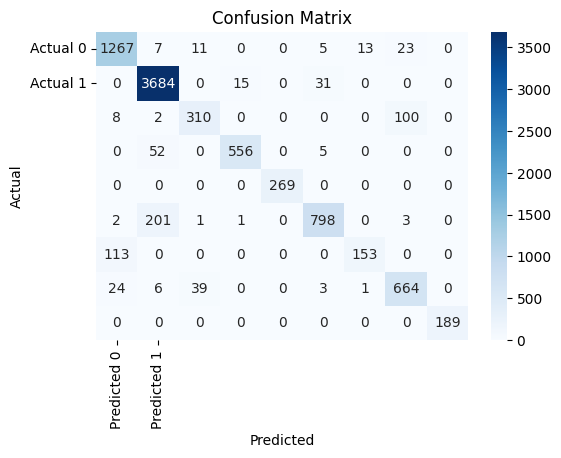

In [ ]:
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Predicted 0", "Predicted 1"], yticklabels=["Actual 0", "Actual 1"])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

Random Forest

In [ ]:
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier(criterion="entropy",random_state=0)
classifier.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', random_state=0)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
term_model = RandomForestClassifier(random_state=51)
term_model.fit(X_train,y_train)

RandomForestClassifier(random_state=51)

In [ ]:
y_pred = term_model.predict(X_test)
#accuracy=accuracy_score(y_1d,y_pred)
y_pred1 = np.argmax(y_pred, axis=0)
# If y_test is in one-hot encoded format, convert it to class indices
#y_true_classes = np.argmax(y_test, axis=1)
# Calculate precision and recall
accuracy=accuracy_score(y_test,y_pred)
print(accuracy)
precision = precision_score(y_test, y_pred,average='weighted')
recall = recall_score(y_test, y_pred,average='weighted')
print("Accuracy = ",accuracy)
print("prevision = ",precision)
print("Recall = ",recall)

0.9194717157550257
Accuracy =  0.9194717157550257
prevision =  0.939744762508642
Recall =  0.9194717157550257


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
